In [25]:
import json
import os
import requests
from pycocotools.coco import COCO
import urllib.request

# Define the class names and their corresponding COCO class IDs
class_names = ['handbag', 'backpack', 'suitcase']
class_ids = [27, 31, 33]  # These are the category IDs for handbag, backpack, and suitcase in COCO

# Directory to save the images and annotations
save_dir = 'coco_subset'
images_dir = os.path.join(save_dir, 'images')
annotations_dir = os.path.join(save_dir, 'annotations')
os.makedirs(images_dir, exist_ok=True)
os.makedirs(annotations_dir, exist_ok=True)

# Download COCO annotations
annotation_url = 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'
annotation_zip_path = os.path.join(annotations_dir, 'annotations_trainval2017.zip')
if not os.path.exists(annotation_zip_path):
    print("Downloading annotations...")
    urllib.request.urlretrieve(annotation_url, annotation_zip_path)

# Extract annotations
import zipfile
with zipfile.ZipFile(annotation_zip_path, 'r') as zip_ref:
    zip_ref.extractall(annotations_dir)

# Load COCO annotations
annotation_file = os.path.join(annotations_dir, 'annotations', 'instances_train2017.json')
coco = COCO(annotation_file)

# Get image IDs for the specified classes
img_ids = []
for class_id in class_ids:
    img_ids += coco.getImgIds(catIds=[class_id])

# Remove duplicates
img_ids = list(set(img_ids))

# Download images and save annotations for each image
for img_id in img_ids:
    img_info = coco.loadImgs(img_id)[0]
    img_url = img_info['coco_url']
    img_path = os.path.join(images_dir, img_info['file_name'])

    # Download image if it doesn't exist
    if not os.path.exists(img_path):
        print(f"Downloading image: {img_info['file_name']}")
        urllib.request.urlretrieve(img_url, img_path)

    # Get annotations for the image
    ann_ids = coco.getAnnIds(imgIds=[img_id], catIds=class_ids, iscrowd=None)
    anns = coco.loadAnns(ann_ids)

    # Save annotations to a file
    annotation_path = os.path.join(annotations_dir, f"{img_info['file_name'].split('.')[0]}.json")
    with open(annotation_path, 'w') as f:
        json.dump(anns, f)

print("Download and annotation extraction completed.")


loading annotations into memory...
Done (t=33.72s)
creating index...
index created!
Download and annotation extraction completed.


In [1]:
import os
import requests
from pycocotools.coco import COCO
import urllib.request
import json

# Define the class names and their corresponding COCO class IDs
class_names = ['handbag', 'backpack', 'suitcase']
class_ids = [27, 31, 33]  # These are the category IDs for handbag, backpack, and suitcase in COCO

# Directory to save the images and annotations
save_dir = 'coco_subset'
images_dir = os.path.join(save_dir, 'images_folder')
annotations_dir = os.path.join(save_dir, 'annotations')
os.makedirs(images_dir, exist_ok=True)
os.makedirs(annotations_dir, exist_ok=True)

# Use the already existing annotations
annotation_file = os.path.join(annotations_dir, 'annotations', 'instances_val2017.json')
coco = COCO(annotation_file)

# Get image IDs for the specified classes
img_ids = []
for class_id in class_ids:
    img_ids += coco.getImgIds(catIds=[class_id])

# Remove duplicates
img_ids = list(set(img_ids))

# Download images and save annotations for each image
for img_id in img_ids:
    img_info = coco.loadImgs(img_id)[0]
    img_url = img_info['coco_url']
    img_path = os.path.join(images_dir, img_info['file_name'])

    # Download image if it doesn't exist
    if not os.path.exists(img_path):
        print(f"Downloading image: {img_info['file_name']}")
        urllib.request.urlretrieve(img_url, img_path)

    # Get annotations for the image
    ann_ids = coco.getAnnIds(imgIds=[img_id], catIds=class_ids, iscrowd=None)
    anns = coco.loadAnns(ann_ids)

    # Save annotations to a file
    annotation_path = os.path.join(annotations_dir, f"{img_info['file_name'].split('.')[0]}.json")
    with open(annotation_path, 'w') as f:
        json.dump(anns, f)

print("Download and annotation extraction completed.")


loading annotations into memory...
Done (t=0.59s)
creating index...
index created!
Download and annotation extraction completed.


In [2]:
from pycocotools.coco import COCO

# Path to the COCO 2017 annotations file
annotation_file = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\annotations\annotations_trainval2017\annotations\instances_train2017.json'

# Load the COCO annotations
coco = COCO(annotation_file)

# Get all category IDs and names
categories = coco.loadCats(coco.getCatIds())

# Print class IDs and class names
print("Class ID - Class Name")
for category in categories:
    print(f"{category['id']} - {category['name']}")


loading annotations into memory...
Done (t=14.17s)
creating index...
index created!
Class ID - Class Name
1 - person
2 - bicycle
3 - car
4 - motorcycle
5 - airplane
6 - bus
7 - train
8 - truck
9 - boat
10 - traffic light
11 - fire hydrant
13 - stop sign
14 - parking meter
15 - bench
16 - bird
17 - cat
18 - dog
19 - horse
20 - sheep
21 - cow
22 - elephant
23 - bear
24 - zebra
25 - giraffe
27 - backpack
28 - umbrella
31 - handbag
32 - tie
33 - suitcase
34 - frisbee
35 - skis
36 - snowboard
37 - sports ball
38 - kite
39 - baseball bat
40 - baseball glove
41 - skateboard
42 - surfboard
43 - tennis racket
44 - bottle
46 - wine glass
47 - cup
48 - fork
49 - knife
50 - spoon
51 - bowl
52 - banana
53 - apple
54 - sandwich
55 - orange
56 - broccoli
57 - carrot
58 - hot dog
59 - pizza
60 - donut
61 - cake
62 - chair
63 - couch
64 - potted plant
65 - bed
67 - dining table
70 - toilet
72 - tv
73 - laptop
74 - mouse
75 - remote
76 - keyboard
77 - cell phone
78 - microwave
79 - oven
80 - toaster
81 

loading annotations into memory...
Done (t=14.93s)
creating index...
index created!


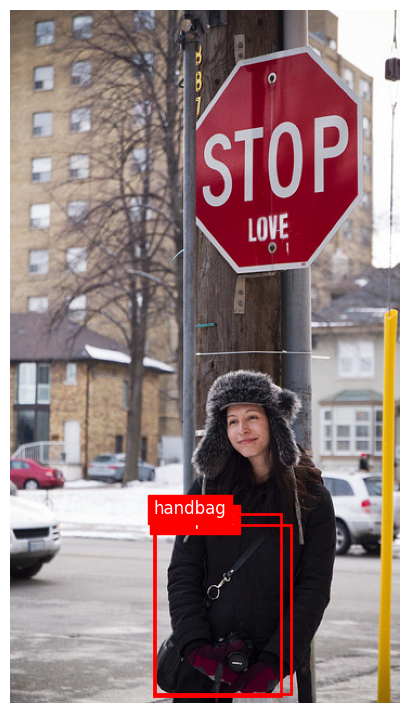

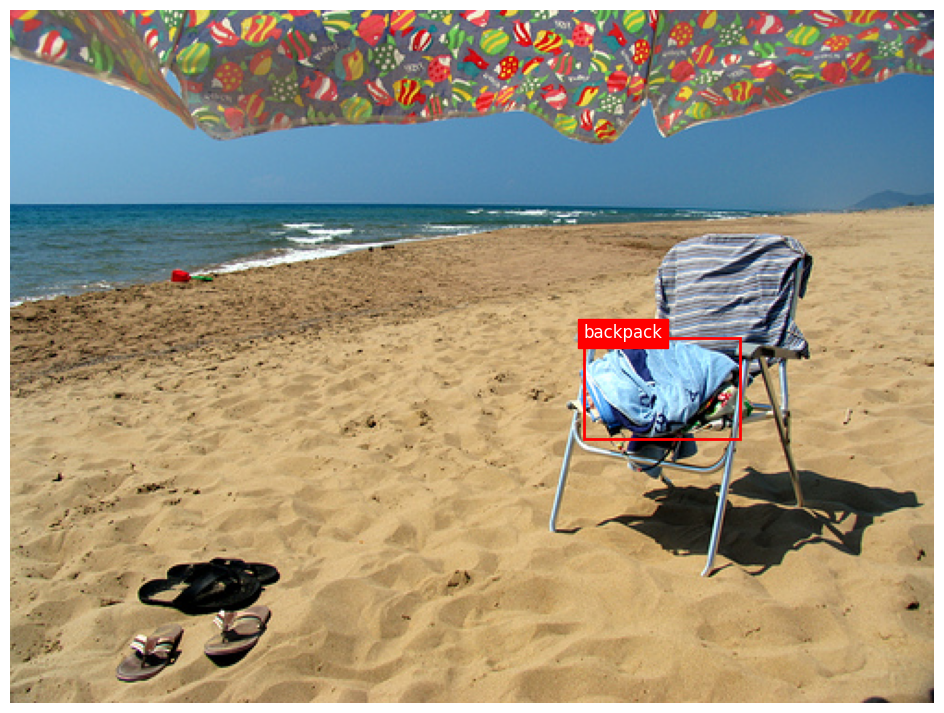

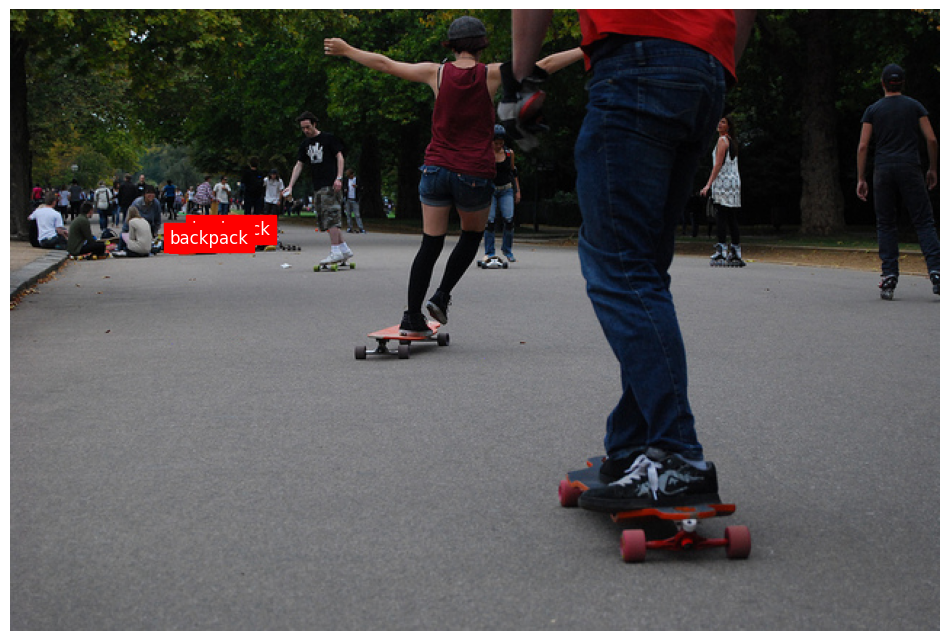

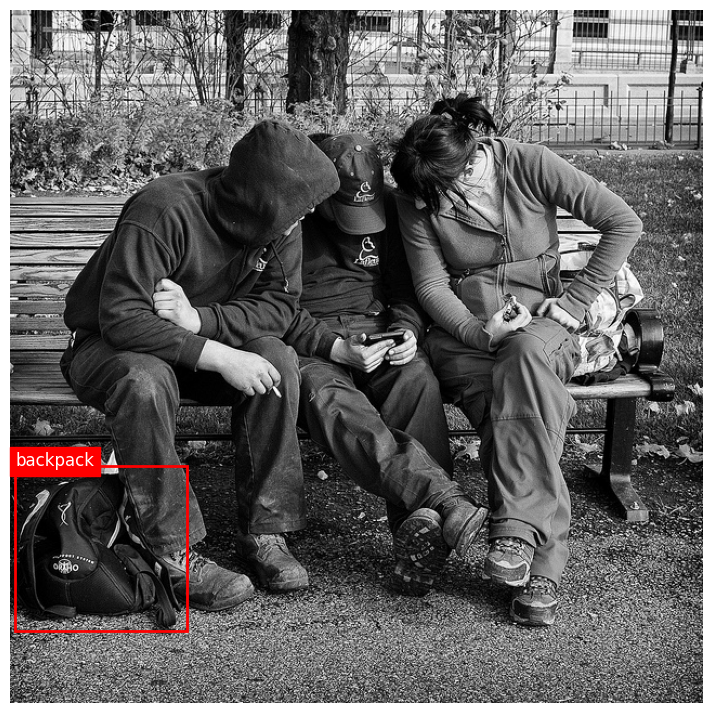

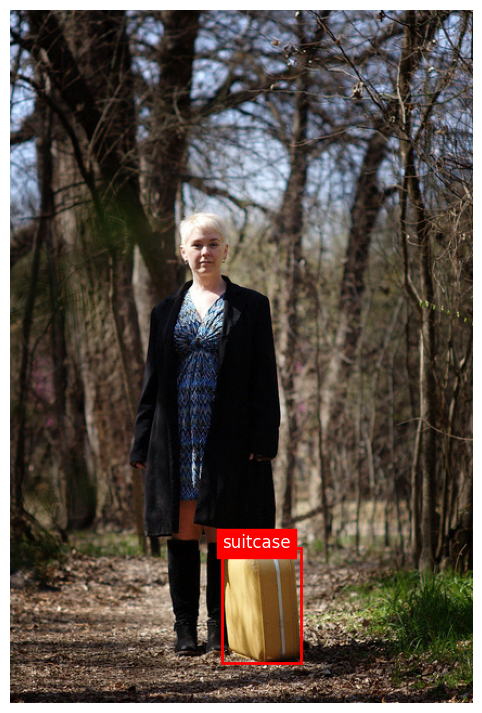

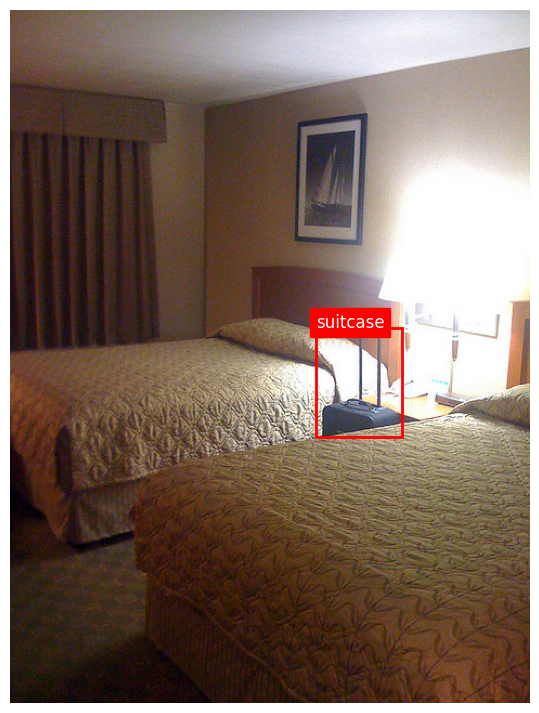

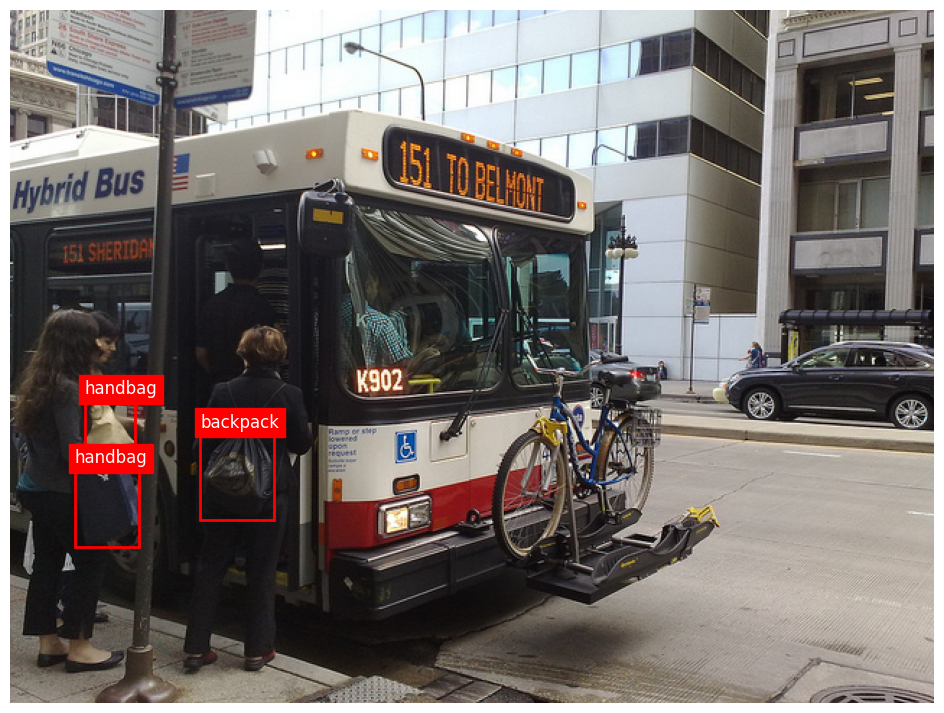

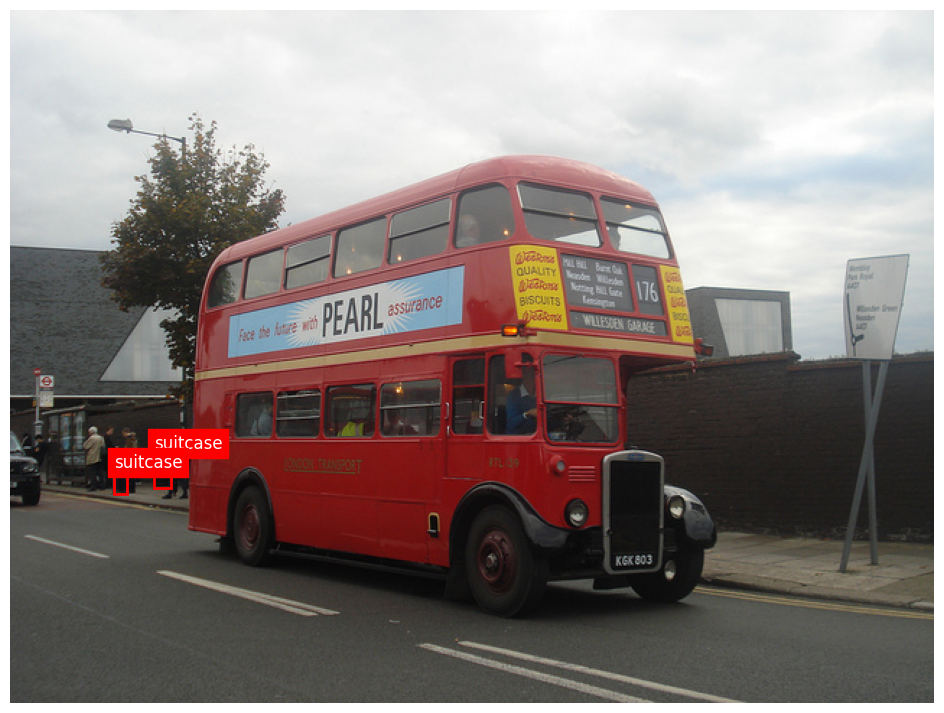

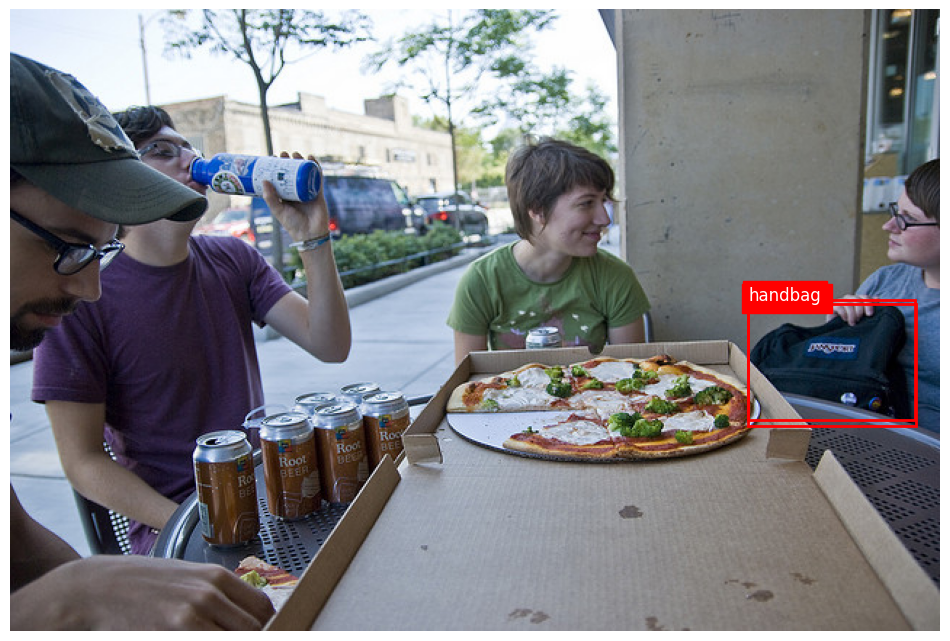

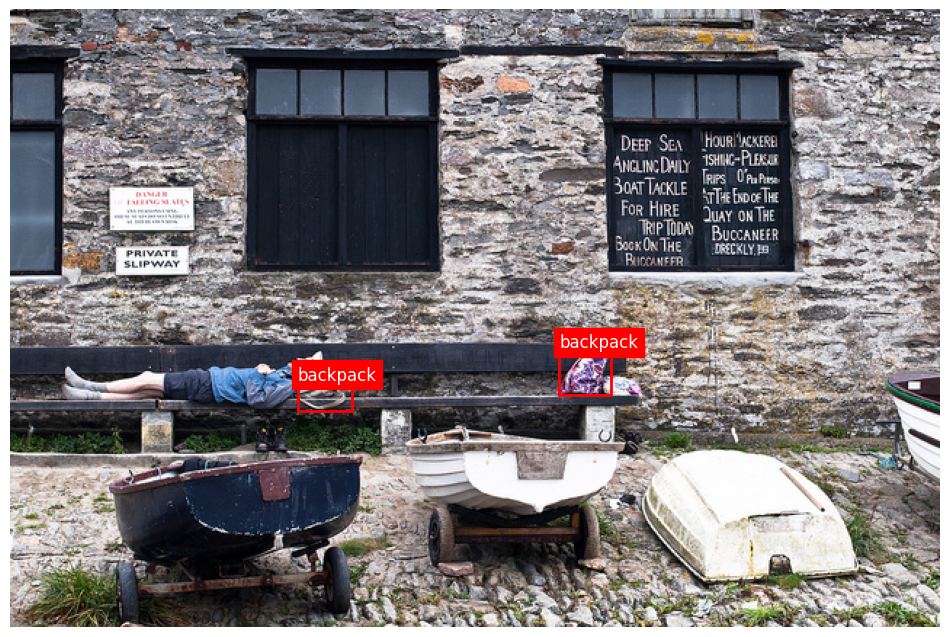

In [1]:
import os
import json
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pycocotools.coco import COCO

# Define the class names and their corresponding COCO class IDs
class_names = ['handbag', 'backpack', 'suitcase']
class_ids = [31, 27, 33]  # Correct COCO class IDs for handbag, backpack, and suitcase

# Directory where images and annotations are stored
images_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\images_folder'
annotations_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\annotations'

# Path to the existing COCO annotations file
annotation_file = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\annotations\annotations_trainval2017\annotations\instances_train2017.json'
coco = COCO(annotation_file)

# Get image IDs for the specified classes
img_ids = []
for class_id in class_ids:
    img_ids += coco.getImgIds(catIds=[class_id])

# Remove duplicates
img_ids = list(set(img_ids))

# Randomly select 10 image IDs for each class
random_img_ids = random.sample(img_ids, min(10, len(img_ids)))

# Function to display images with annotations
def display_image_with_annotations(image_id):
    img_info = coco.loadImgs(image_id)[0]
    img_path = os.path.join(images_dir, img_info['file_name'])

    # Load image
    image = plt.imread(img_path)

    # Load corresponding annotations
    annotation_filename = f"{img_info['file_name'].split('.')[0]}.json"
    annotation_path = os.path.join(annotations_dir, annotation_filename)
    
    if not os.path.exists(annotation_path):
        print(f"Annotation file not found: {annotation_path}")
        return
    
    with open(annotation_path, 'r') as f:
        anns = json.load(f)

    # Display image
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image)

    # Add annotations
    for ann in anns:
        x, y, w, h = ann['bbox']
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        category_id = ann['category_id']
        category_name = coco.loadCats(category_id)[0]['name']
        plt.text(x, y, category_name, color='white', fontsize=12, backgroundcolor='red')

    plt.axis('off')
    plt.show()

# Display 10 random images with annotations
for img_id in random_img_ids:
    display_image_with_annotations(img_id)


# VALIDATE

In [2]:
import os

# Paths to the images and annotations directories
images_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\images_folder'
annotations_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\annotations'

# Get lists of image files and annotation files
image_files = os.listdir(images_dir)
annotation_files = os.listdir(annotations_dir)

# Create sets of image file names (without extensions) and annotation file names (without extensions)
image_basenames = {os.path.splitext(img)[0] for img in image_files}
annotation_basenames = {os.path.splitext(ann)[0] for ann in annotation_files}

# Check for missing annotations
missing_annotations = image_basenames - annotation_basenames
missing_images = annotation_basenames - image_basenames

# Print the results
if missing_annotations:
    print("Missing annotations for the following images:")
    for img in missing_annotations:
        print(img)
else:
    print("All images have corresponding annotations.")

if missing_images:
    print("Missing images for the following annotations:")
    for ann in missing_images:
        print(ann)
else:
    print("All annotations have corresponding images.")


All images have corresponding annotations.
Missing images for the following annotations:
annotations_trainval2017
000000262145


In [5]:
import os

# Paths to the images and annotations directories
images_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\images_folder'
annotations_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\annotations'

# Get lists of image files and annotation files, filtering for relevant file extensions
image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg') or f.endswith('.png')]
annotation_files = [f for f in os.listdir(annotations_dir) if f.endswith('.json')]

# Create sets of image file names (without extensions) and annotation file names (without extensions)
image_basenames = {os.path.splitext(img)[0] for img in image_files}
annotation_basenames = {os.path.splitext(ann)[0] for ann in annotation_files}

# Check for missing annotations
missing_annotations = image_basenames - annotation_basenames
missing_images = annotation_basenames - image_basenames

# Report missing annotations
if missing_annotations:
    print("Images without corresponding annotations:")
    for img in missing_annotations:
        print(img)
else:
    print("All images have corresponding annotations.")

# Report missing images
if missing_images:
    print("Annotations without corresponding images:")
    for ann in missing_images:
        print(ann)
else:
    print("All annotations have corresponding images.")

# Perform deletions
for img in missing_annotations:
    img_path = os.path.join(images_dir, f"{img}.jpg")  # assuming the images are in jpg format
    if os.path.exists(img_path):
        os.remove(img_path)
        print(f"Deleted image: {img_path}")

for ann in missing_images:
    ann_path = os.path.join(annotations_dir, f"{ann}.json")
    if os.path.exists(ann_path):
        os.remove(ann_path)
        print(f"Deleted annotation: {ann_path}")

# Final validation
remaining_image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg') or f.endswith('.png')]
remaining_annotation_files = [f for f in os.listdir(annotations_dir) if f.endswith('.json')]
remaining_image_basenames = {os.path.splitext(img)[0] for img in remaining_image_files}
remaining_annotation_basenames = {os.path.splitext(ann)[0] for ann in remaining_annotation_files}

if remaining_image_basenames == remaining_annotation_basenames:
    print("All images have corresponding annotations.")
else:
    print("There are still mismatched files.")
    remaining_missing_annotations = remaining_image_basenames - remaining_annotation_basenames
    remaining_missing_images = remaining_annotation_basenames - remaining_image_basenames
    
    if remaining_missing_annotations:
        print("Remaining images without corresponding annotations:")
        for img in remaining_missing_annotations:
            print(img)
    
    if remaining_missing_images:
        print("Remaining annotations without corresponding images:")
        for ann in remaining_missing_images:
            print(ann)


All images have corresponding annotations.
All annotations have corresponding images.
All images have corresponding annotations.


In [6]:
import os
import json
import shutil
import random
import matplotlib.pyplot as plt

# Paths to the directories
images_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\images_folder'
annotations_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\annotations'
output_images_train_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\images\train'
output_images_val_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\images\val'
output_labels_train_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\labels\train'
output_labels_val_dir = r'C:\Users\temir\Documents\KULcourses\Thesis_CV\code_yolo8_base\y8\yolo_tracking\tracking\coco_subset\labels\val'

# Create directories if they don't exist
os.makedirs(output_images_train_dir, exist_ok=True)
os.makedirs(output_images_val_dir, exist_ok=True)
os.makedirs(output_labels_train_dir, exist_ok=True)
os.makedirs(output_labels_val_dir, exist_ok=True)

# Define the class IDs you are interested in
class_ids = [27, 31, 33]  # COCO class IDs for backpack, handbag, and suitcase
class_names = ['backpack', 'handbag', 'suitcase']

def convert_to_yolo_format(box, img_width, img_height):
    x_center = (box[0] + box[2] / 2) / img_width
    y_center = (box[1] + box[3] / 2) / img_height
    width = box[2] / img_width
    height = box[3] / img_height
    return [x_center, y_center, width, height]

# Process each annotation file
for annotation_file in os.listdir(annotations_dir):
    if annotation_file.endswith('.json'):
        with open(os.path.join(annotations_dir, annotation_file), 'r') as f:
            annotations = json.load(f)

        image_file = annotation_file.replace('.json', '.jpg')
        image_path = os.path.join(images_dir, image_file)

        if not os.path.exists(image_path):
            continue

        # Get image dimensions
        img = plt.imread(image_path)
        img_height, img_width = img.shape[:2]

        yolo_annotations = []

        for ann in annotations:
            if ann['category_id'] in class_ids:
                yolo_box = convert_to_yolo_format(ann['bbox'], img_width, img_height)
                yolo_annotations.append([class_ids.index(ann['category_id'])] + yolo_box)

        # Determine if the file should go into train or val
        if random.random() < 0.8:  # 80% for training, 20% for validation
            output_images_dir = output_images_train_dir
            output_labels_dir = output_labels_train_dir
        else:
            output_images_dir = output_images_val_dir
            output_labels_dir = output_labels_val_dir

        # Copy image to the output directory
        shutil.copy(image_path, os.path.join(output_images_dir, image_file))

        # Save YOLO annotations
        output_annotation_file = os.path.join(output_labels_dir, annotation_file.replace('.json', '.txt'))
        with open(output_annotation_file, 'w') as f:
            for yolo_ann in yolo_annotations:
                f.write(' '.join(map(str, yolo_ann)) + '\n')

print("Annotations converted to YOLO format and files organized.")


Annotations converted to YOLO format and files organized.
